In [1]:
import cv2
import pandas as pd
from os import listdir
from os.path import isfile, join
import matplotlib.pyplot as plt
import os
from PIL import Image
import json
import numpy as np
from PIL import Image
from PIL import ImageDraw


# We load the csv files into a dataframe and print the head of it, note the number of images is 3073

In [2]:
def read_data(fn):
    df = pd.read_csv(fn)
    print(df.head())
    print('Shape of data is: ' + str(df.shape))
    return df
df = read_data('hf336_03_images.csv')

   image.id                                          image.url     genus  \
0     14805  https://bisque.cyverse.org/image_service/00-vA...  Trillium   
1     14809  http://portal.neherbaria.org/imglib/cnh/UConn_...  Trillium   
2     14813  http://deliver.odai.yale.edu/content/repositor...  Trillium   
3     14817  http://portal.neherbaria.org/imglib/cnh/UConn_...  Trillium   
4     14821  https://bisque.cyverse.org/image_service/00-2s...  Trillium   

        species  
0  grandiflorum  
1  grandiflorum  
2  grandiflorum  
3  grandiflorum  
4  grandiflorum  
Shape of data is: (3073, 4)


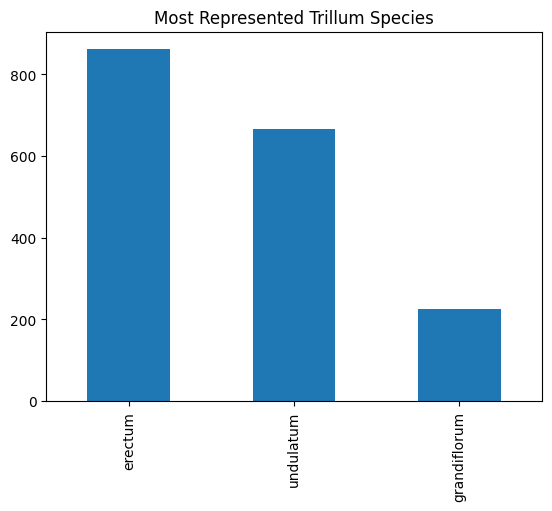

In [3]:
genus_counts = df['genus'].value_counts()
df.loc[df['genus'] == genus_counts.keys()[0]]['species'].value_counts().plot(kind='bar',title = "Most Represented Trillum Species");

In [4]:
def explore_df_data(df):
        genus_counts = df['genus'].value_counts()
        print('genus_counts:')
        print(genus_counts)
        species_1 = genus_counts.keys()[0]
        species_2 = genus_counts.keys()[1]
        print('\nTypes for ' + species_1)
        print(df.loc[df['genus'] == genus_counts.keys()[0]]['species'].value_counts())
        print('\nTypes for ' + species_2)
        print(df.loc[df['genus'] == genus_counts.keys()[1]]['species'].value_counts())
        return species_1,species_2
species_1,species_2 = explore_df_data(df)

genus_counts:
Trillium    1755
Anemone     1318
Name: genus, dtype: int64

Types for Trillium
erectum         862
undulatum       667
grandiflorum    226
Name: species, dtype: int64

Types for Anemone
quinquefolia    686
hepatica        524
canadensis      108
Name: species, dtype: int64


# We see that overall the trillium species has the most examples

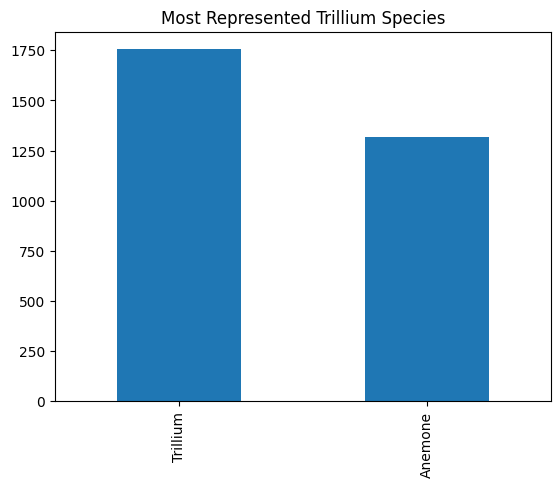

In [5]:
df['genus'].value_counts().plot(kind='bar',title = "Most Represented " +  species_1 + " Species");

# Representing the different Genus types as a bar graph

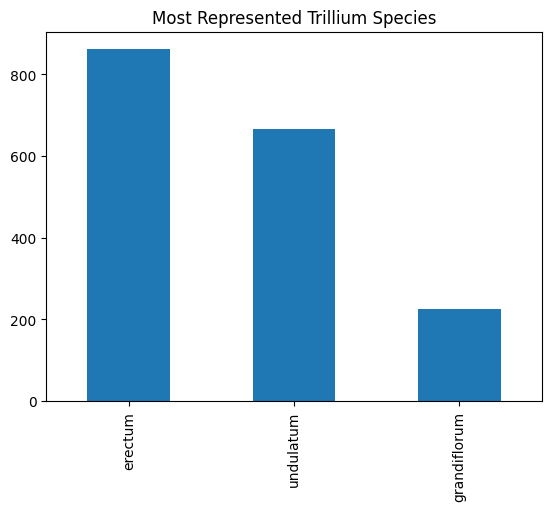

In [6]:
df.loc[df['genus'] == species_1]['species'].value_counts().plot(kind='bar',title = "Most Represented " +  species_1 + " Species");

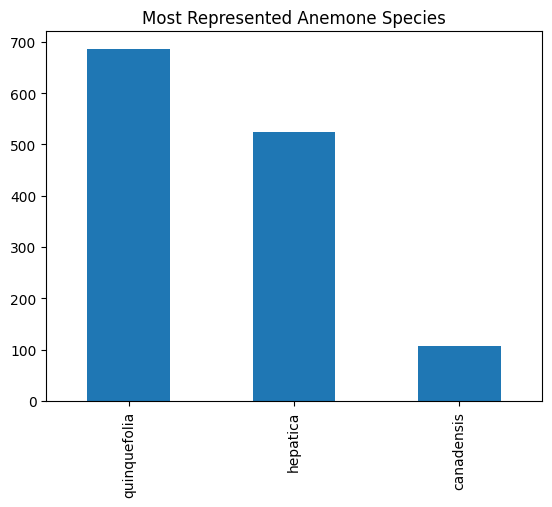

In [7]:
df.loc[df['genus'] == species_2]['species'].value_counts().plot(kind='bar',title = "Most Represented " +  species_2 + " Species");

# We read all the image names in the dataset and display one of the images

['15661.jpg', '16446.jpg', '15631.jpg', '16980.jpg', '15536.jpg']


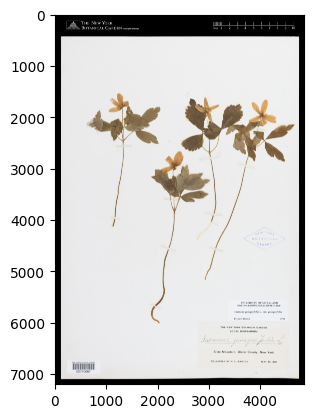

In [8]:
def get_image_names():
    folder_loc = 'images'
    img_names = [f for f in listdir(folder_loc) if isfile(join(folder_loc, f))]
    print(img_names[:5])
    img = cv2.imread('images/' + img_names[79])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.show()
    return img_names

img_names = get_image_names()

# We now read the images that take up the most storage space and display them with their size and shape

In [9]:
def read_min_max_images(img_names):
    all_images = []
    min_file = 10000000
    max_file = -1
    min_file_name = ''
    max_file_name = ''
    for pos,img_name in enumerate(img_names):
        file_size = os.stat('images/' + img_name).st_size
        if file_size < min_file:
            min_file = file_size
            min_file_name = img_name
        elif file_size > max_file:
            max_file = file_size
            max_file_name = img_name
    smallest_image =Image.open('images/'+ min_file_name)
    largest_image =Image.open('images/'+ max_file_name)
    fontsize = 100
    plt.figure(figsize=(80, 80))
    plt.subplot(1, 2, 1) 
    plt.title("Smallest Image Scan\n"+str(min_file/1000)+'kb'+'\nImage Size '+str(smallest_image.size),fontdict={'fontsize': fontsize})
    plt.imshow(smallest_image,interpolation='nearest');
    plt.subplot(1,2,2)
    plt.title("Largest Image Scan\n"+str(max_file/1000)+'kb'+'\nImage Size '+str(largest_image.size),fontdict={'fontsize': fontsize})
    plt.imshow(largest_image,interpolation='nearest');
    return [smallest_image,min_file_name],[largest_image,max_file_name]

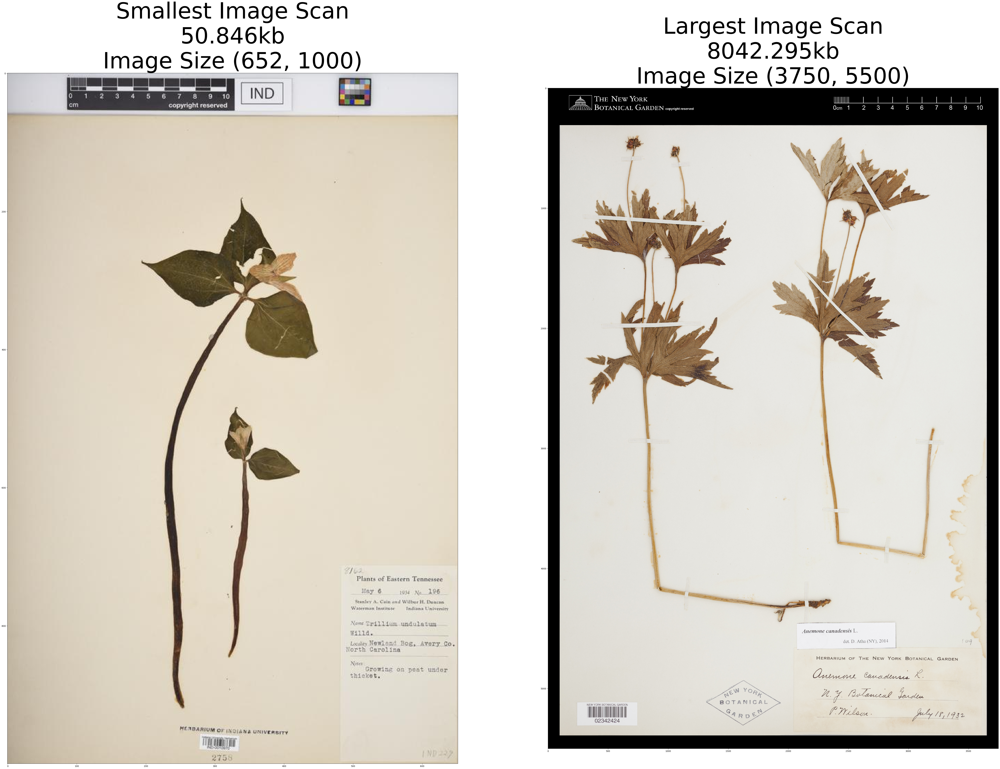

In [10]:
smallest_image_info,largest_image_info = read_min_max_images(img_names)

# Now we take the smallest and largest images and overlay the dodecagons segmentation masks to display how they appear on the image

In [11]:
def draw_polygon_PIL(image,poly,segmentation):
    pdraw = ImageDraw.Draw(poly)
    pdraw.polygon(segmentation,
    fill=(255,0,255,50),outline=(0,0,0,255))
    image.paste(poly,mask=poly)
    return image
    
def read_images(image_info,size):
    image,file_name = image_info
    poly = Image.new('RGBA', image.size)
    json_file_name = df.loc[df['image.id']==int(file_name.split('.jpg')[0])]['genus'].values[0] + '_' + df.loc[df['image.id']==int(file_name.split('.jpg')[0])]['species'].values[0]
    json_file = json.load(open('species_names/' + json_file_name + '/fulltrain.json'))
    segmentations = []
    for data_point in json_file['annotations']:
        if data_point['image_id'] == int(file_name.split('.jpg')[0]):
            segmentations+=data_point['segmentation']
    for segmentation in segmentations:
        image = draw_polygon_PIL(image,poly,segmentation)
    plt.figure(figsize=(10,10))
    if size == 'largest':
        plt.title('Largest image segmentations')
    elif size == 'smallest':
        plt.title('Smallest image segmentations')
    plt.imshow(image)

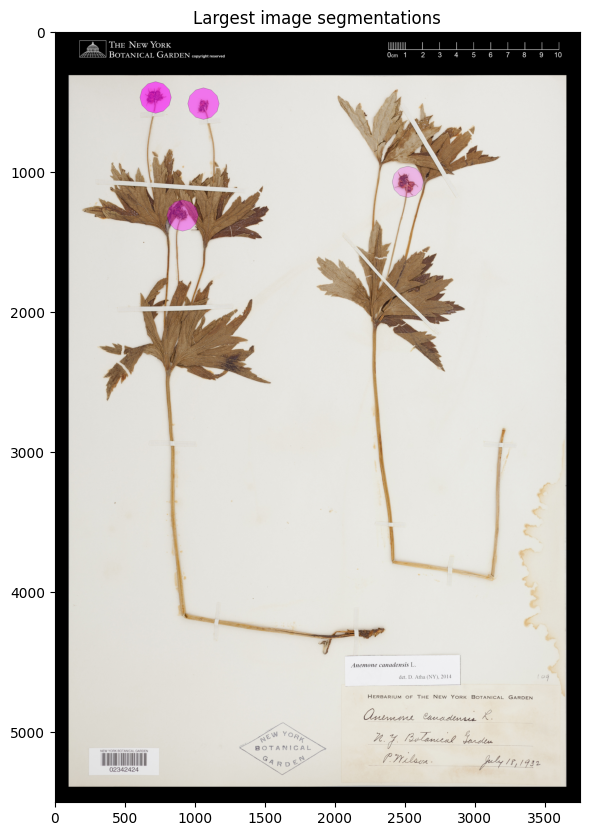

In [12]:
read_images(largest_image_info,'largest')

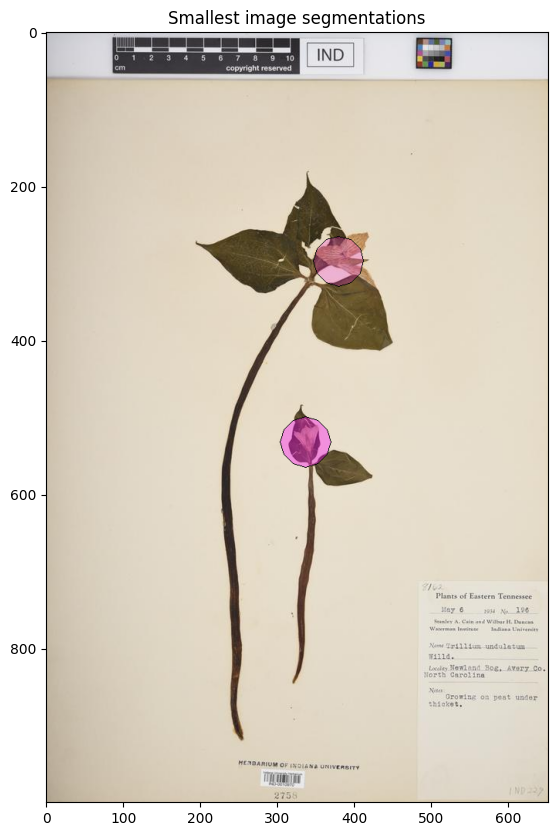

In [13]:
read_images(smallest_image_info,'smallest')

# We now load all the json data and display the distribution of images in the train and test set

Total training data: 6321
Total training data: 1588


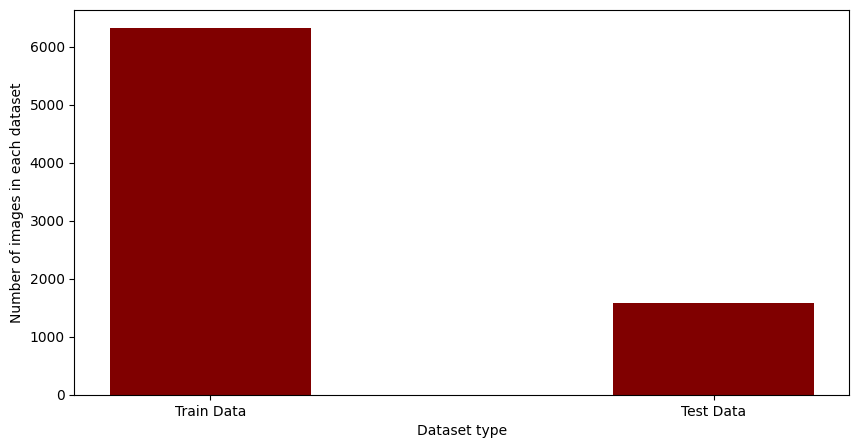

In [14]:
def read_all_json_data(fns):
    ft_json_file = json.load(open(fns[0]))
    total_train_images = 0
    for data_point in ft_json_file['annotations']:
        total_train_images+=1
    print('Total training data: ' + str(total_train_images))
    test_json_file = json.load(open(fns[1]))
    total_test_images = 0
    for data_point in test_json_file['annotations']:
        total_test_images+=1
    print('Total training data: ' + str(total_test_images))
    data = {'Train Data':total_train_images, 'Test Data':total_test_images}
    dataset_info = list(data.keys())
    values = list(data.values())

    fig = plt.figure(figsize = (10, 5))

    # creating the bar plot
    plt.bar(dataset_info, values, color ='maroon',
            width = 0.4)

    plt.xlabel("Dataset type")
    plt.ylabel("Number of images in each dataset")
    plt.show()
    return ft_json_file,test_json_file
    
train_json_file, test_json_file = read_all_json_data(['species_names/all/fulltrain.json','species_names/all/test.json'])

# We now look at the distribution of buds, flowers and fruits for the train and test set, with the train set having a large amount of flowers

In [15]:
def get_dataset_type_distribution(json_data):
    plant_info = {'buds':0,'flowers':0,'fruits':0}
    for data_point in json_data['annotations']:
        if data_point['category_id'] == 1:
            plant_info['buds']+=1
        elif data_point['category_id'] == 2:
            plant_info['flowers']+=1
        elif data_point['category_id'] == 3:
            plant_info['fruits']+=1
    print('Plant type distribution')
    print('Buds were: ' + str(plant_info['buds']))
    print('Flowers were: ' + str(plant_info['flowers']))
    print('Fruits were: ' + str(plant_info['fruits']))
    return plant_info

In [16]:
train_dist_info = get_dataset_type_distribution(train_json_file)

Plant type distribution
Buds were: 385
Flowers were: 4878
Fruits were: 1058


In [17]:
test_dist_info = get_dataset_type_distribution(test_json_file)

Plant type distribution
Buds were: 107
Flowers were: 1241
Fruits were: 240


# We see with combining the number of buds, flowers and fruits, that flowers significants outshine both the fruits and buds, with buds having 492 (6.2%) and flowers having 6119 (77.4%)

In [18]:
total_buds = train_dist_info['buds'] + test_dist_info['buds']
total_flowers = train_dist_info['flowers'] + test_dist_info['flowers']
total_fruits = train_dist_info['fruits'] + test_dist_info['fruits']

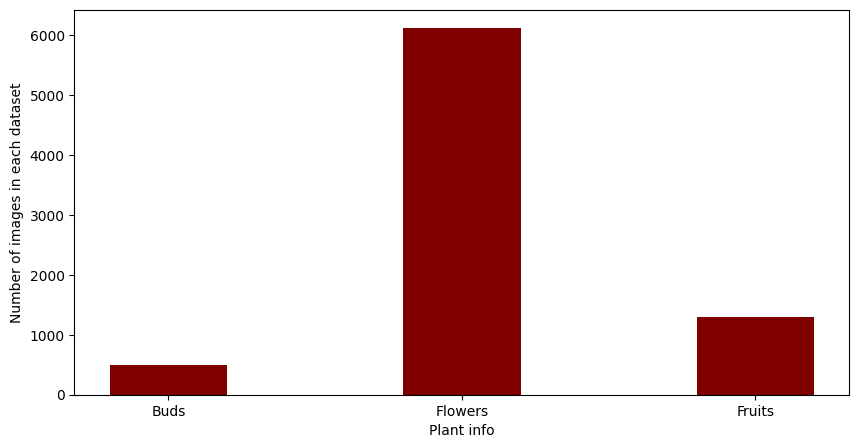

In [19]:
data = {'Buds':total_buds, 'Flowers':total_flowers, 'Fruits':total_fruits}
dataset_info = list(data.keys())
values = list(data.values())

fig = plt.figure(figsize = (10, 5))

# creating the bar plot
plt.bar(dataset_info, values, color ='maroon',
        width = 0.4)

plt.xlabel("Plant info")
plt.ylabel("Number of images in each dataset")
plt.show()

# We now want to visualize the buds, flowers and fruits on images, and we can see them below

In [20]:
def show_plant_info_type(json_data,plant_info):
    img_name = ''
    for data_point in json_data['annotations']:
        if data_point['category_id'] == plant_info and plant_info == 1:
            plt.figure(figsize=(10,10))
            plt.title('Buds on plant')
            img_name = data_point['image_id']
            break
        elif data_point['category_id'] == plant_info and plant_info == 2:
            plt.figure(figsize=(10,10))
            plt.title('Flowers on plant')
            img_name = data_point['image_id']
            break
        elif data_point['category_id'] == plant_info and plant_info == 3:
            plt.figure(figsize=(10,10))
            plt.title('Fruits on plant')
            img_name = data_point['image_id']
            break
    image =Image.open('images/'+ str(img_name) + '.jpg')
    poly = Image.new('RGBA', image.size)
    segmentations = []
    for data_point in json_data['annotations']:
        if data_point['image_id'] == int(img_name) and data_point['category_id'] == plant_info:
            segmentations+=data_point['segmentation']
    for segmentation in segmentations:
        image = draw_polygon_PIL(image,poly,segmentation)
    plt.imshow(image)

/usr4/cs640g/kmn5409/.local/lib/python3.10/site-packages/PIL/TiffImagePlugin.py:850: UserWarning: Corrupt EXIF data.  Expecting to read 12 bytes but only got 10. 
  warnings.warn(str(msg))


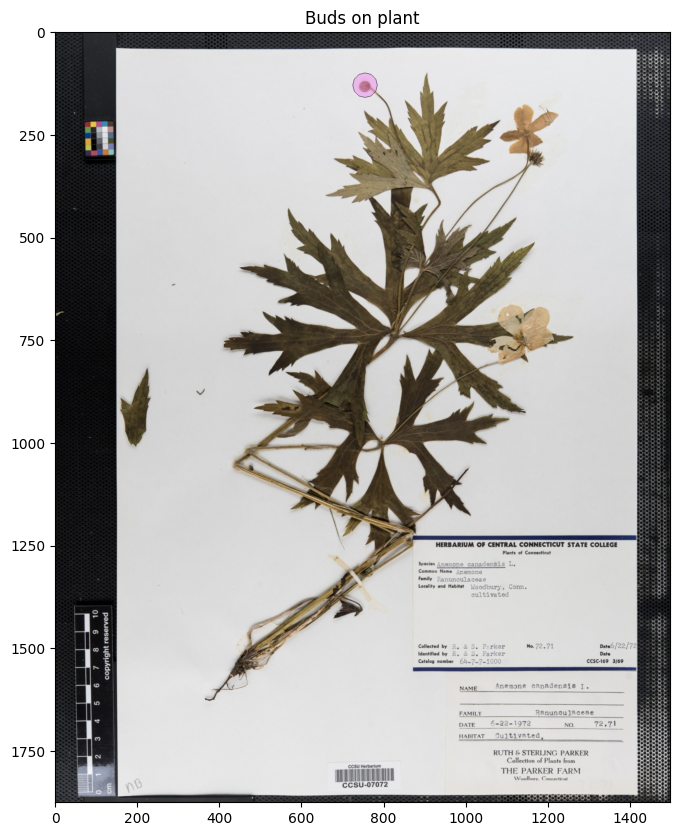

In [21]:
show_plant_info_type(train_json_file,1)

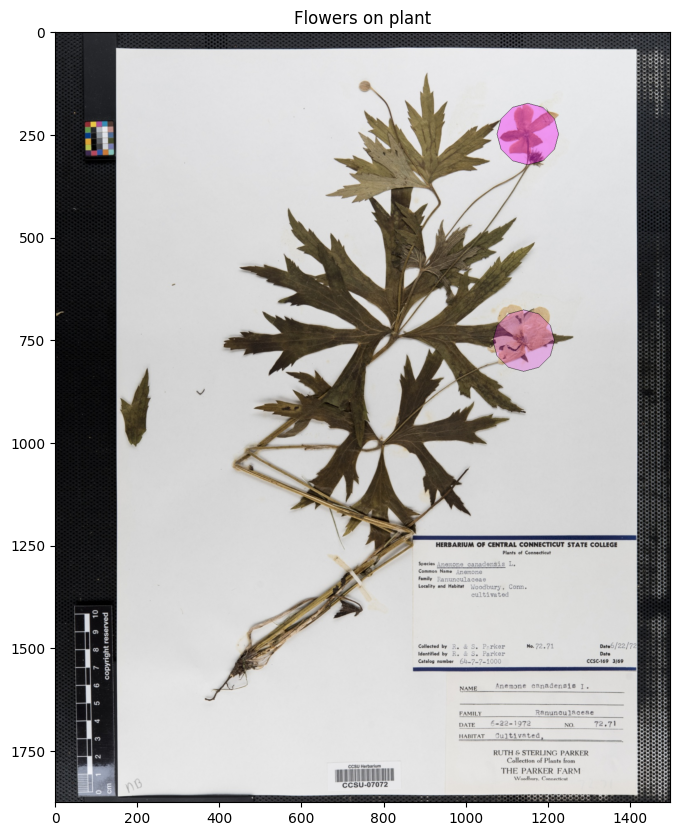

In [22]:
show_plant_info_type(train_json_file,2)

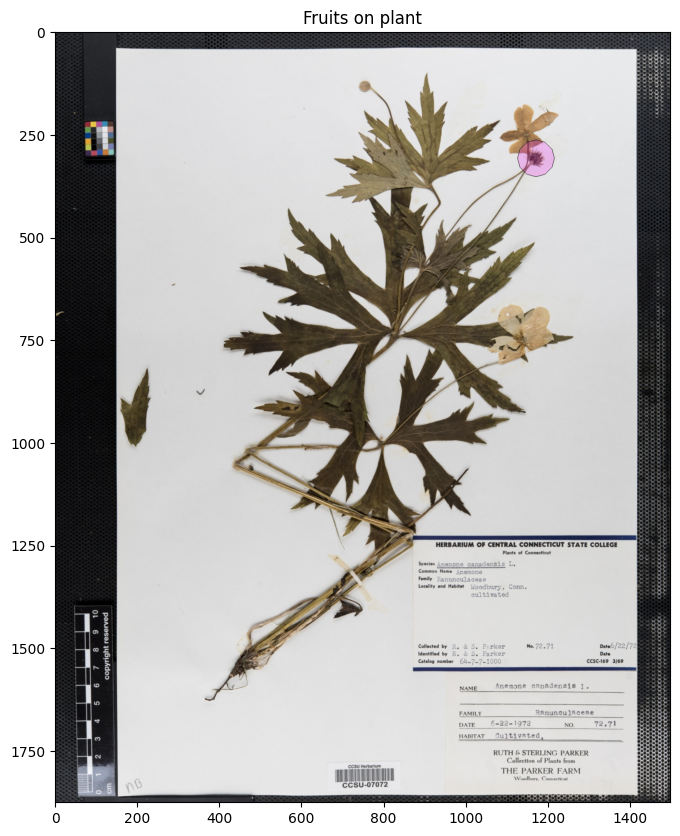

In [23]:
show_plant_info_type(train_json_file,3)